In [1]:
from lxml import etree
import json
import pandas as pd
import matplotlib.pyplot as plt 
%matplotlib inline  
import seaborn as sns
import networkx as nx
import itertools
import matplotlib
import numpy as np


# Parsing 

In [2]:
def parse(file_path): 
    i = 0 
    tmp = ''
    key = ''
    xml2 =etree.iterparse(file_path, recover=True)
    data = []
    for action, elem in xml2:
        data.append((elem.attrib,elem.text))
    data_dict = {}
    l = set()
    for elem in data: 
        try : 
            tmp = key 
            key = elem[0].get('qualifier')
            if key == 'author':
                l.add(elem[1])
                data_dict[key] = l
                if tmp == key:
                    l.add(elem[1])
                    data_dict[key] = l
                else : 
                    l = set()
            else : 
                data_dict[key] = elem[1]
        except TypeError: 
                data_dict['None'] = elem[1]
    return data_dict


### Get all data 

In [3]:
import os
rootdir = '/Users/nourghaliaabassi/Desktop/papers-import'


In [4]:
all_data = {}
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        path = os.path.join(subdir, file)
        if 'dublin_core' in (path) : 
            num_doc = subdir.split('/')[-1]
            if num_doc in all_data.keys():
                #print(num_doc)
                all_data[num_doc+'_'] = parse(path)
            else : 
                all_data[num_doc] = parse(path)

In [5]:
columns = set()
for keys,items in all_data.items():
    for keys_in,items_in in items.items():
        columns.add(keys_in)

In [6]:
df_data = pd.DataFrame(index=all_data.keys(),columns=columns)

In [7]:
for ind in df_data.index:
    for column in columns: 
        try : 
            df_data.loc[ind,column] = all_data[ind][column]
        except KeyError:
            df_data.loc[ind,column] = ''

In [8]:
df_data['citation'].head()

307    Jeong, H. & Hmelo-Silver, C. E. (2015). Resear...
309    Wake, J. D., Guribye, F., & Wasson, B. (2015)....
391    Borge, M., Ong, Y. S., & Rosé, C. P. (2015). ...
150    Davidsen, J. & Ryberg, T. (2015). “This Is the...
396    Saleh, A., Danish, J. A., Enyedy, N., & Lee, C...
Name: citation, dtype: object

In [9]:
df_data.head()

,accessioned,iso,None,uri,author,available,none,issued,abstract,citation
307,2017-06-19T14:15:51Z,en,\n,https://doi.dx.org/10.22318/cscl2015.307,"{Hmelo-Silver, Cindy E.}",2017-06-19T14:15:51Z,Book chapter,2015-07,While research questions play a critical role ...,"Jeong, H. & Hmelo-Silver, C. E. (2015). Resear..."
309,2017-06-19T14:15:51Z,en,\n,https://doi.dx.org/10.22318/cscl2015.309,"{Wasson, Barbara, Guribye, Frode}",2017-06-19T14:15:51Z,Book chapter,2015-07,This paper describes a study of students desig...,"Wake, J. D., Guribye, F., & Wasson, B. (2015)...."
391,2017-06-19T14:15:51Z,en,\n,https://doi.dx.org/10.22318/cscl2015.391,"{Rosé, Carolyn Penstein, Ong, Yann Shiou}",2017-06-19T14:15:51Z,Book chapter,2015-07,In this paper we assess the utility of an acti...,"Borge, M., Ong, Y. S., & Rosé, C. P. (2015). ..."
150,2017-06-19T14:15:51Z,en,\n,https://doi.dx.org/10.22318/cscl2015.150,"{Ryberg, Thomas}",2017-06-19T14:15:51Z,Book chapter,2015-07,"In CSCL studies, language is often foregrounde...","Davidsen, J. & Ryberg, T. (2015). “This Is the..."
396,2017-06-19T14:51:54Z,en,\n,https://doi.dx.org/10.22318/cscl2015.396,"{Lee, Christine, Enyedy, Noel, Danish, Joshua A.}",2017-06-19T14:51:54Z,Book chapter,2015-07,Designs that leverage embodiment argue that em...,"Saleh, A., Danish, J. A., Enyedy, N., & Lee, C..."


In [10]:
df_data.loc['105','citation']

'Downton, M. P. (2015). “That’s What Everyone Else Is Saying…”: Collaborative Reflection-in-Action during Creative Activities In  Lindwall, O., Häkkinen, P., Koschman, T. Tchounikine, P.  Ludvigsen, S. (Eds.) (2015). Exploring the Material Conditions of Learning: The Computer Supported Collaborative Learning (CSCL) Conference 2015, Volume 1. Gothenburg, Sweden: The International Society of the Learning Sciences.'

In [11]:
df_data.loc['105','available']

'2017-06-19T14:15:51Z'

In [12]:
def convert(arg): 
    try : 
        arg = dateutil.parser.parse(arg)
    except TypeError: 
        arg = arg 
    return arg 

In [13]:
import dateutil.parser
df_data['available'] = df_data['available'].apply(lambda x : convert(x))
df_data['accessioned'] = df_data['accessioned'].apply(lambda x : convert(x))

In [14]:
df_data.head()

,accessioned,iso,None,uri,author,available,none,issued,abstract,citation
307,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.307,"{Hmelo-Silver, Cindy E.}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,While research questions play a critical role ...,"Jeong, H. & Hmelo-Silver, C. E. (2015). Resear..."
309,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.309,"{Wasson, Barbara, Guribye, Frode}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,This paper describes a study of students desig...,"Wake, J. D., Guribye, F., & Wasson, B. (2015)...."
391,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.391,"{Rosé, Carolyn Penstein, Ong, Yann Shiou}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,In this paper we assess the utility of an acti...,"Borge, M., Ong, Y. S., & Rosé, C. P. (2015). ..."
150,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.150,"{Ryberg, Thomas}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,"In CSCL studies, language is often foregrounde...","Davidsen, J. & Ryberg, T. (2015). “This Is the..."
396,2017-06-19 14:51:54+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.396,"{Lee, Christine, Enyedy, Noel, Danish, Joshua A.}",2017-06-19 14:51:54+00:00,Book chapter,2015-07,Designs that leverage embodiment argue that em...,"Saleh, A., Danish, J. A., Enyedy, N., & Lee, C..."


In [15]:
#fig, ax = plt.subplots()
#fig.set_size_inches(20, 8.27)
#plt.xlabel('Number of authors')
#plt.ylabel('Number of publications')
#x = plt.title('Number of publication / number of authors')
#x = plt.hist(df_data.groupby(by = 'author').count()['uri'])

In [16]:
#y = df_data.groupby(by = 'author').count()['uri']

In [17]:
#fig, ax = plt.subplots()
#fig.set_size_inches(20, 8.27)
#x = sns.barplot(y[y>1].index,y[y>1],color = 'grey')
#plt.xticks(rotation=50)
#plt.xlabel('Authors')
#plt.ylabel('Number of publications')
#x = plt.title('Number of publication per author')

In [18]:
df_data['year'] = df_data['issued'].apply(lambda x : x.split('-')[0])

In [19]:
df_data['year'].nunique()

3

In [20]:
df_data.loc['320','citation']

'Martin, N. D., Gnesdilow, D., & Puntambekar, S. (2015). Peer Scaffolding to Learn Science in Symmetrical Groups Collaborating Over Time In  Lindwall, O., Häkkinen, P., Koschman, T. Tchounikine, P.  Ludvigsen, S. (Eds.) (2015). Exploring the Material Conditions of Learning: The Computer Supported Collaborative Learning (CSCL) Conference 2015, Volume 1. Gothenburg, Sweden: The International Society of the Learning Sciences.'

### Network X 

In [21]:
authors_graph = nx.Graph()

In [22]:
authors_nodes = set()
for set_authors in df_data['author']: 
    for author in set_authors:
        authors_nodes.add(author)
authors_nodes = list(authors_nodes)

In [23]:
authors_graph.add_nodes_from(authors_nodes)

In [24]:
authors_edges = set()
for set_authors in df_data['author']:
        for pair in itertools.permutations(set_authors,r=2):
            authors_edges.add(pair)
authors_edges = list(authors_edges)

In [25]:
authors_graph.add_edges_from(list(authors_edges))

In [26]:
for elem in authors_edges: 
    authors_graph.add_edge(elem[0],elem[1])

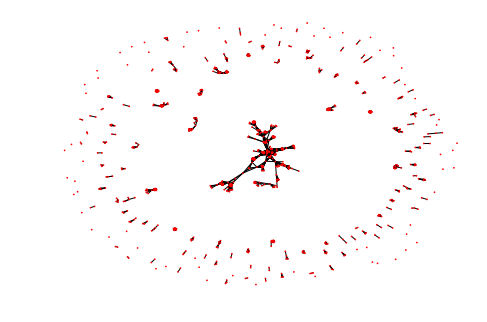

In [27]:
nx.draw(authors_graph,pos = nx.spring_layout(authors_graph),node_size=[0.5,0.5])

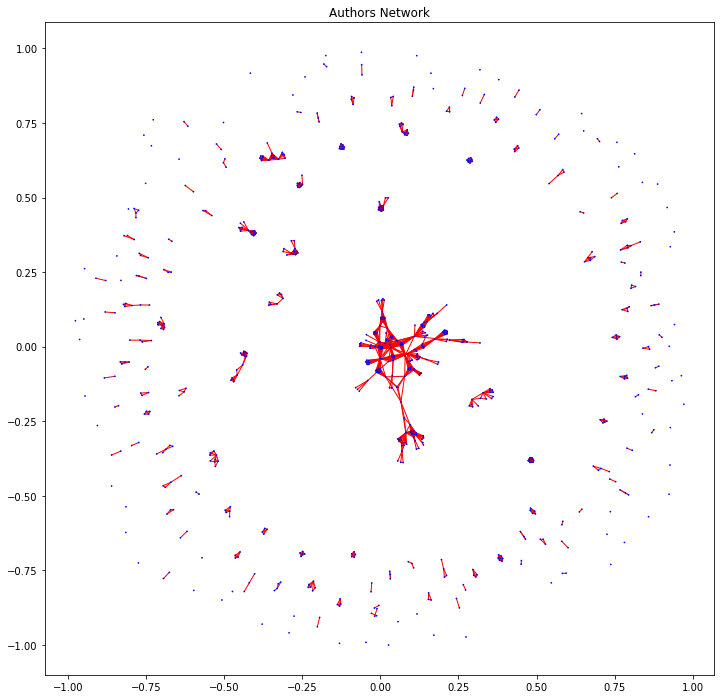

In [28]:
plt.figure(figsize=(12,12)) 
plt.title('Authors Network')
nx.draw_networkx(authors_graph,node_color='b',edge_color='r',node_size=[0.5,0.5],with_labels=False,pos= nx.spring_layout(authors_graph))
plt.show()


### Key words extraction

#### TF-IDF

In [29]:
import re
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.snowball import SnowballStemmer


In [30]:
text = np.array(df_data['abstract'])

In [31]:
#ps = PorterStemmer()
#stemmer = SnowballStemmer("english")
stop_words = set(stopwords.words())
l = ['the','and','of','is','with','it','this','to','but','not','in','for','some','as','no','was','just','would']
for word in l : 
    stop_words.add(word)

In [32]:
for i,abstract in enumerate(text): 
    try: 
        text[i] = re.sub(pattern='[^a-zA-Z]', repl=' ', string = abstract)
        text[i] = text[i].lower()
        text[i] = [word for word in text[i].split() if not word in stop_words]
        #text[i] = [stemmer.stem(t) for t in text[i]]
        #text[i] = [ps.stem(word) for word in text[i] if not word in set(stopwords.words('english'))]
        text[i] = ' '.join(text[i])
        
    except TypeError: 
        text[i] = ''

In [33]:
bow_transformer = CountVectorizer(ngram_range=(1,3)).fit(text)
len(bow_transformer.vocabulary_)

54815

In [34]:
#bow_transformer.vocabulary_

In [35]:
matrix_ = bow_transformer.transform(text)
matrix_.shape

(410, 54815)

In [36]:
tfidf_transformer = TfidfTransformer()
tfidf_matrix = tfidf_transformer.fit_transform(matrix_)

In [37]:
feature_names = bow_transformer.vocabulary_

In [38]:
#doc = 0
#feature_index = tfidf_matrix[doc,:].nonzero()[1]
#tfidf_scores = zip(feature_index, [tfidf_matrix[doc, x] for x in feature_index])

In [39]:
feature_names = {v: k for k, v in bow_transformer.vocabulary_.items()}


In [40]:
key_words = []
classment = []
for doc in range(len(text)):
    classment = []
    feature_index = tfidf_matrix[doc,:].nonzero()[1]
    tfidf_scores = zip(feature_index, [tfidf_matrix[doc, x] for x in feature_index])
    for w, s in [(feature_names[i], s) for (i, s) in tfidf_scores]:
        classment.append((w, s))
    classment.sort(key = lambda x : x[1],reverse=True)
    key_words.append(classment[:7])

In [41]:
key_words[:1]

[[('research questions', 0.3354469601717947),
  ('research', 0.24821789183335757),
  ('questions', 0.21530536395847108),
  ('research questions methods', 0.1433688162444777),
  ('relationship research questions', 0.1433688162444777),
  ('relationship research', 0.1433688162444777),
  ('questions methods', 0.1433688162444777)]]

#### Using Rake

In [42]:
import rake
import operator

In [43]:
rake_object = rake.Rake("ressources/SmartStoplist.txt")

In [44]:
rake_object.run(df_data['abstract'][0]).sort(key = lambda x : x[1],reverse= True)

In [45]:
keywords = []
for abstract in df_data['abstract']:
    try:
        classment = rake_object.run(abstract)
        classment.sort(key = lambda x : x[1]>3,reverse= True)
        keywords.append(classment[:15])
    except TypeError: 
        keywords.append('no_text')

In [46]:
keywords[:1]

[[('research questions influenced research methods', 15.733333333333333),
  ('research questions play', 8.6),
  ('cscl empirical research', 8.466666666666665),
  ('future cscl research', 8.466666666666665),
  ('research questions', 5.6),
  ('cscl research', 5.466666666666667),
  ('earlier analysis', 4.0),
  ('analysis showed', 4.0),
  ('curricular interventions', 4.0),
  ('results confirmed', 4.0),
  ('intuitive conceptions', 4.0),
  ('critical role', 3.5),
  ('examined systematically', 3.5),
  ('research', 2.8),
  ('methods', 2.3333333333333335)]]

### On the whole text

In [ ]:
#print(raw['content'])

In [ ]:
import sys
import os

In [66]:
j = 0
TOTEXT = 'pdftotext -nopgbrk -eol mac'
rootdir = '/Users/nourghaliaabassi/Desktop/paper2'

for subdir, dirs, files in os.walk(rootdir):
    #print(files)
    for file in files:
       
        path = os.path.join(subdir, file)
        #print(path)
        if 'pdf' in path:
            j = j + 1 
            #print(path)
            os.system(TOTEXT + path)

In [70]:
rootdir = 'data/papers'
contents = []
i = 0
source = []
errors = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        if 'txt' in file:
            i += 1
            path = os.path.join(subdir, file)
            with open(path) as file:
                try:
                    text = file.read()
                    contents.append(text)
                    source.append(subdir[len(rootdir):])
                except:
                    name, message, content = sys.exc_info()
                    errors.append(message)


In [73]:
len(contents)

874

In [72]:
selection = contents[0][contents[0].find('Introduction'):contents[0].find('\n\nReferences\n')]

In [178]:
keywords_in_text = []
for text_ in contents:
    selection = text_[text_.find('Introduction'):text_.find('\n\nReferences\n')]
    if selection == '' and text_ != ' ':
        selection = text_[text_.find('Keywords'):text_.find('\n\nReferences\n')]
    try:
        classment = rake_object.run(selection)
        classment.sort(key = lambda x : x[1]>3,reverse= True)
        keywords_in_text.append(classment[:15])
    except TypeError: 
        keywords_in_text.append('PROBLEM')

In [215]:
l = [['' for i in range(15)] for elem in range(len(keywords_in_text))]
for i,elem in enumerate(keywords_in_text):
    l2 = ''
    for elem2 in elem:
        l2 = l2 + ',' +(elem2[0])
    l[i] = l2


In [207]:
l[:10]

[',data included detailed observation notes,latecareer/retired community scientists frequently identified,maintaining rigorous protocol standards,daily maintenance tasks related,novice community scientists learn,collecting rigorous data,early/mid career community scientists,study related lab tasks,demographic survey results,complete rote tasks,existing institutional systems,scientific skill requisite,partitioned community scientists,consented community scientists,participating community scientists',
 ',designing robot bodies class session,participants included ten eighth graders,time observational coding tool called,cordtra diagrams provided visual representations,collaborative data analysis sessions informed,generalized observation reporting protocol,helping learners make connections,50 minute daily class sessions,quickly generate cordtra diagragms,empirical social sciences research,develop engineering design practices,iterative video analysis—moving,collaborative engineering design p

In [216]:
df_key_words = pd.DataFrame(l, columns = {'key_words_rak'})


In [75]:
keywords_in_text[:1]

[[('data included detailed observation notes', 20.333333333333336),
  ('latecareer/retired community scientists frequently identified',
   16.713333333333335),
  ('maintaining rigorous protocol standards', 15.5),
  ('daily maintenance tasks related', 13.761904761904763),
  ('novice community scientists learn', 10.213333333333335),
  ('collecting rigorous data', 9.833333333333334),
  ('early/mid career community scientists', 9.746666666666666),
  ('study related lab tasks', 9.36904761904762),
  ('demographic survey results', 9.0),
  ('complete rote tasks', 8.428571428571429),
  ('existing institutional systems', 8.333333333333334),
  ('scientific skill requisite', 8.222222222222221),
  ('partitioned community scientists', 8.213333333333335),
  ('consented community scientists', 8.213333333333335),
  ('participating community scientists', 8.213333333333335)]]

### With TF_IDF

In [76]:
len(contents)

874

In [77]:
tmp_content = []
for text_ in contents:
    selection = text_[text_.find('Introduction'):text_.find('\n\nReferences\n')]
    if selection == '' and text_ != ' ':
        selection =text_[text_.find('Keywords'):text_.find('\n\nReferences\n')]
    if selection == '' and text_ != ' ':
        selection = text_[:text_.find('\n\nReferences\n')]
    if '...............................' in selection :
        selection = ''
    tmp_content.append(selection)

In [78]:
len(tmp_content)

874

In [79]:
for i,text_ in enumerate(tmp_content): 
    #try: 
        tmp_content[i] = re.sub(pattern='[^a-zA-Z]', repl=' ', string = text_)
        tmp_content[i] = tmp_content[i].lower()
        tmp_content[i] = [word for word in tmp_content[i].split() if not word in stop_words]
        #text[i] = [ps.stem(word) for word in text[i] if not word in set(stopwords.words('english'))]
        tmp_content[i] = ' '.join(tmp_content[i])
    #except TypeError: 
        #tmp_content[i] = ''

In [80]:
bow_transformer_big = CountVectorizer(ngram_range=(1,3),max_df=0.8, max_features=2500).fit(tmp_content)

In [81]:
len(bow_transformer_big.vocabulary_)

2500

In [82]:
matrix_big = bow_transformer_big.transform(np.array(tmp_content)[np.array(tmp_content)!=''])
matrix_big.shape

(866, 2500)

In [83]:
tfidf_transformer_2 = TfidfTransformer()
tfidf_matrix_2 = tfidf_transformer_2.fit_transform(matrix_big)

In [84]:
feature_names_big = {v: k for k, v in bow_transformer_big.vocabulary_.items()}


In [200]:
key_words_large = []
classment_large = []
for doc in range(len(np.array(tmp_content)[np.array(tmp_content)!=''])):
    classment_large = []
    feature_index_big = tfidf_matrix_2[doc,:].nonzero()[1]
    tfidf_scores = zip(feature_index_big, [tfidf_matrix_2[doc, x] for x in feature_index_big])
    for w, s in [(feature_names_big[i], s) for (i, s) in tfidf_scores]:
        classment_large.append((w, s))
    classment_large.sort(key = lambda x : x[1],reverse=True)
    key_words_large.append(classment_large[:15])

In [217]:
l = [['' for i in range(15)] for elem in range(len(key_words_large))]
for i,elem in enumerate(key_words_large):
    l2 = ''
    for elem2 in elem:
        l2 = l2 +',' +(elem2[0])
    l[i] = l2

In [218]:
df_key_words.merge(pd.DataFrame(l,columns = {'key_words_tf_idf'}),left_index = True, right_index = True).to_csv('data_key_words.csv')

In [86]:
key_words_large[:1]

[[('community', 0.3911157531453516),
  ('lab', 0.38149148267044963),
  ('scientists', 0.35672219577451963),
  ('genetics', 0.2734899992647644),
  ('participation', 0.2681002083303793),
  ('museum', 0.2401240047073067),
  ('career', 0.1920392940386273)]]

## Doc clustering

In [87]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from collections import Counter


In [88]:
num_clusters = 7
km = KMeans(n_clusters=num_clusters)
%time km.fit(tfidf_matrix_2)
clusters = km.labels_.tolist()

CPU times: user 2min 8s, sys: 886 ms, total: 2min 9s
Wall time: 49.3 s


In [89]:
Counter(clusters)

Counter({0: 175, 1: 116, 2: 121, 3: 52, 4: 300, 5: 65, 6: 37})

In [90]:
titles = [content[:content.find('\n')] if '...............................' not in content else '' for content in contents]

In [91]:
len(np.array(tmp_content)[np.array(tmp_content)!=''])

866

In [92]:
tmp = {'titles': np.array(titles)[np.array(titles)!=''], 'texts' : np.array(tmp_content)[np.array(tmp_content)!=''], 'clusters': clusters}
df_clusters = pd.DataFrame.from_dict(tmp)

In [93]:
df_clusters.head()

,titles,texts,clusters
0,Learning Scientific Practices Through Particip...,introduction last two decades increased focus ...,0
1,Visualizing Complex Classrooms Through Real Ti...,introduction video data one complex types data...,0
2,Opening the Door to Algebra: The Role of Fract...,opening algebra role fraction knowledge algebr...,4
3,Measuring Maker Mindset: Establishing Content ...,introduction recently researchers identified d...,4
4,Fostering University Freshmen’s Mathematical A...,keywords mathematics argumentation collaborati...,4


In [94]:
df_clusters[df_clusters['titles']=='']

,titles,texts,clusters


In [95]:
km.cluster_centers_.argsort()[:, ::-1]

array([[2498,  569, 1975, ..., 1219, 1217, 2366],
       [2272, 2268, 2177, ...,  719, 1217,  839],
       [1975, 1437, 1981, ...,  931, 1979, 1356],
       ...,
       [1001,  344, 2264, ..., 2107, 1217, 1979],
       [ 302,  969,  703, ..., 2107,  185, 2499],
       [ 947,  950, 1668, ..., 1768, 1786, 2499]])

### Visualization of clusters : 

In [96]:
import warnings
warnings.filterwarnings("ignore")

In [97]:
cluster_colors = {0: '#1b9e77', 1: '#d95f02', 2: '#7570b3', 3: '#e7298a', 4: '#66a61e', 5:'#000000',6 : '#0000FF' }


In [98]:
import os  # for os.path.basename
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.manifold import MDS

def plot_cos_dist_clust(X,clusters):
    MDS()
    dist = 1 - cosine_similarity(X)

    # convert two components as we're plotting points in a two-dimensional plane
    # "precomputed" because we provide a distance matrix
    # we will also specify `random_state` so the plot is reproducible.
    mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

    pos = mds.fit_transform(dist)  # shape (n_components, n_samples)

    xs, ys = pos[:, 0], pos[:, 1]
    %matplotlib inline 

    #create data frame that has the result of the MDS plus the cluster numbers and titles
    df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, title=np.array(titles)[np.array(titles)!=''])) 

    #group by cluster
    groups = df.groupby('label')


    # set up plot
    fig, ax = plt.subplots(figsize=(60, 40)) # set size
    ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

    #iterate through groups to layer the plot
    #note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
    for name, group in groups:
        ax.plot(group.x, group.y, marker='o', linestyle='', ms=12, 
                 color=cluster_colors[name], 
                mec='none')
        ax.set_aspect('auto')
        ax.tick_params(\
            axis= 'x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom='off',      # ticks along the bottom edge are off
            top='off',         # ticks along the top edge are off
            labelbottom='off')
        ax.tick_params(\
            axis= 'y',         # changes apply to the y-axis
            which='both',      # both major and minor ticks are affected
            left='off',      # ticks along the bottom edge are off
            top='off',         # ticks along the top edge are off
            labelleft='off')

    ax.legend(numpoints=1)  #show legend with only 1 point

    #add label in x,y position with the label as the film title
    for i in range(len(df)):
        ax.text(df.ix[i]['x'], df.ix[i]['y'], df.ix[i]['title'], size=8)  


    plt.savefig('clusters_small.png')
    plt.show() #show the plot
    
    return 
    

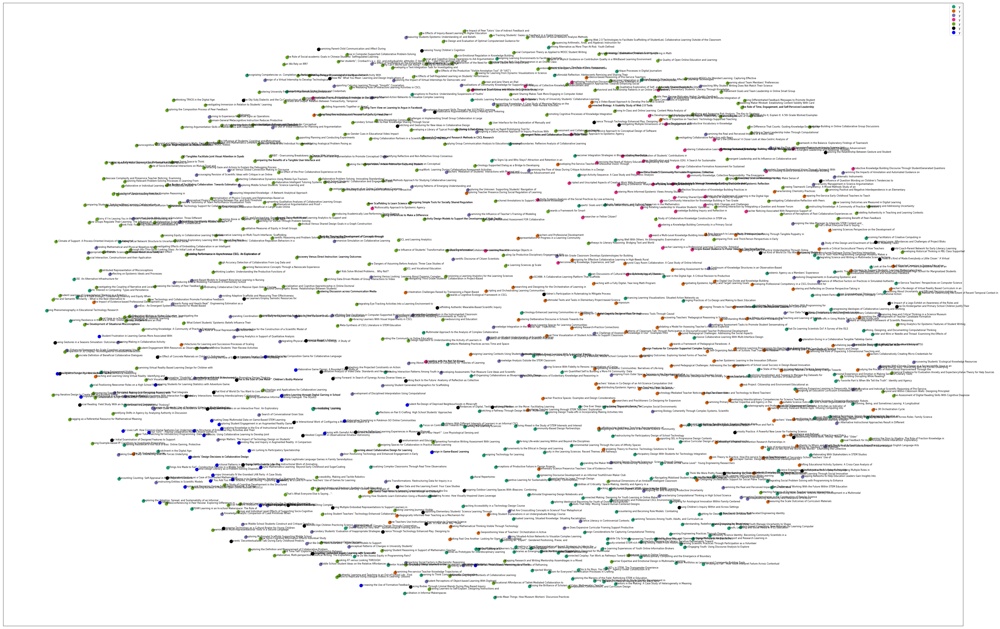

In [99]:
plot_cos_dist_clust(tfidf_matrix_2,clusters)

In [100]:
from __future__ import print_function
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm


def see_clusters(X,clusters,range_n_clusters):
    silhouette = []
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, X.shape[0] + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)
        silhouette.append(silhouette_avg)
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:,0], X[:,1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

    plt.show()
    return silhouette, range_n_clusters

For n_clusters = 2 The average silhouette_score is : 0.013173593999295553
For n_clusters = 5 The average silhouette_score is : 0.015791903779163115
For n_clusters = 7 The average silhouette_score is : 0.018575298005149347
For n_clusters = 10 The average silhouette_score is : 0.023311234015963973
For n_clusters = 20 The average silhouette_score is : 0.030463884621478768
For n_clusters = 30 The average silhouette_score is : 0.036022252336830485
For n_clusters = 50 The average silhouette_score is : 0.04742054964931636
For n_clusters = 70 The average silhouette_score is : 0.05374330815525294
For n_clusters = 100 The average silhouette_score is : 0.07223196024877274


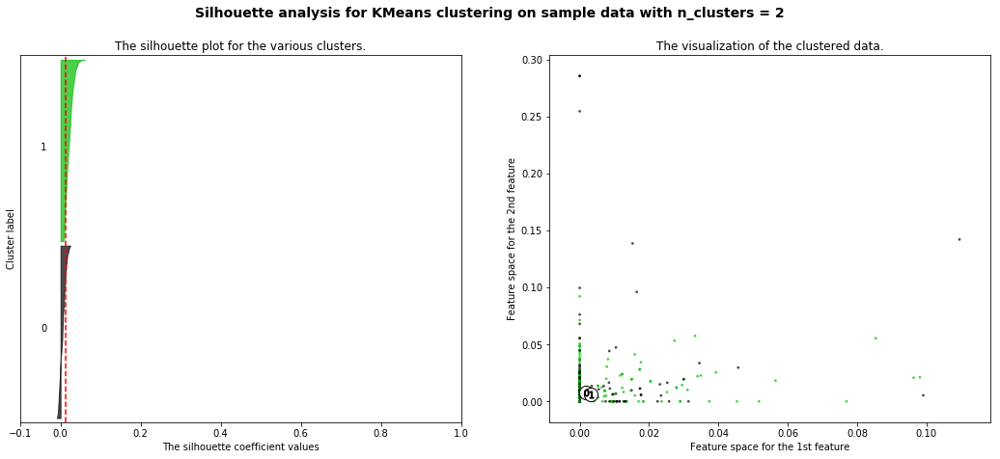

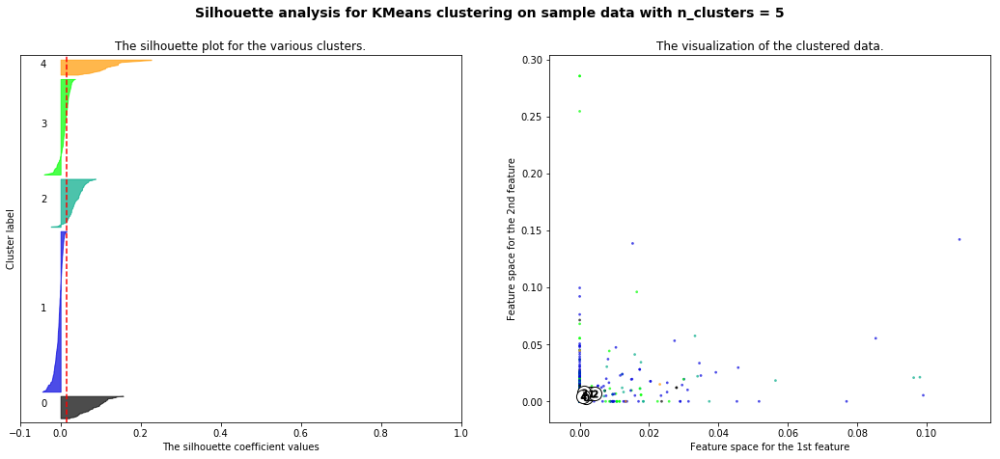

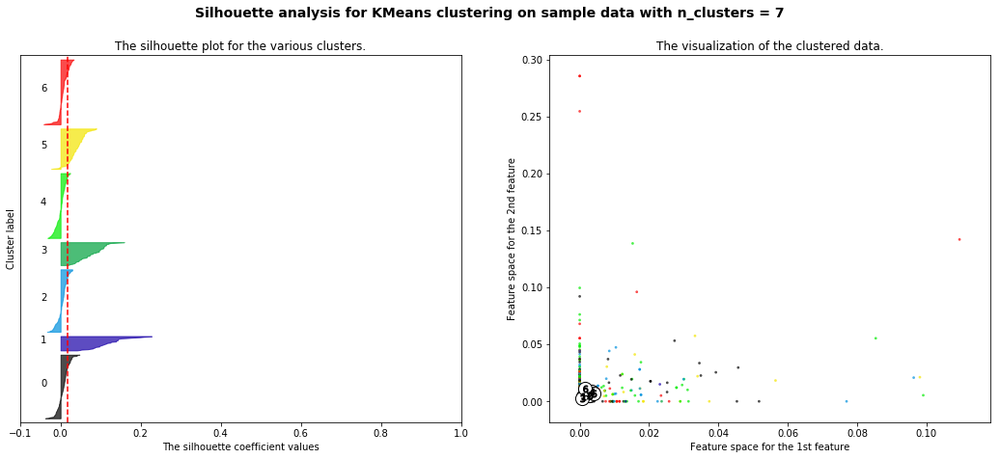

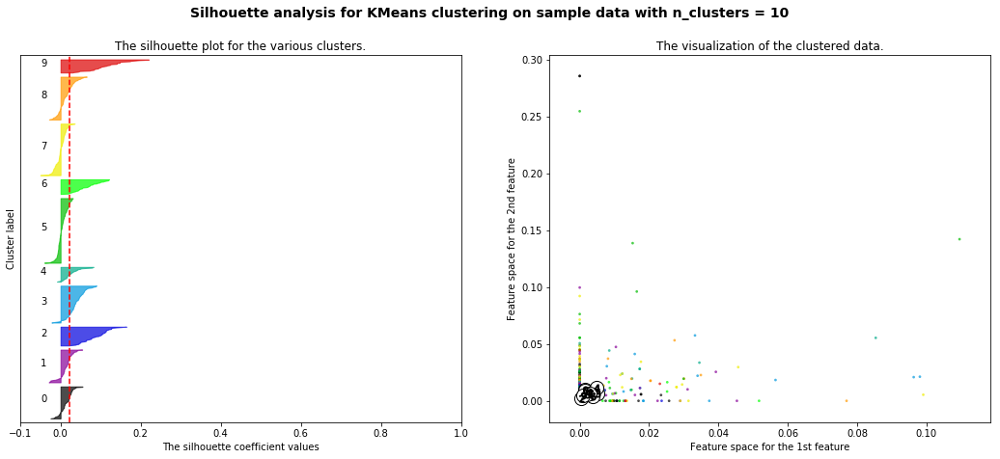

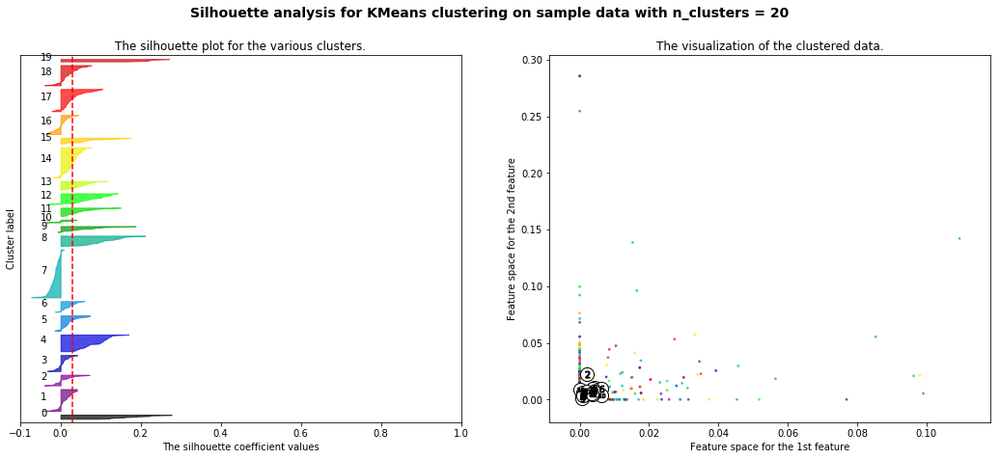

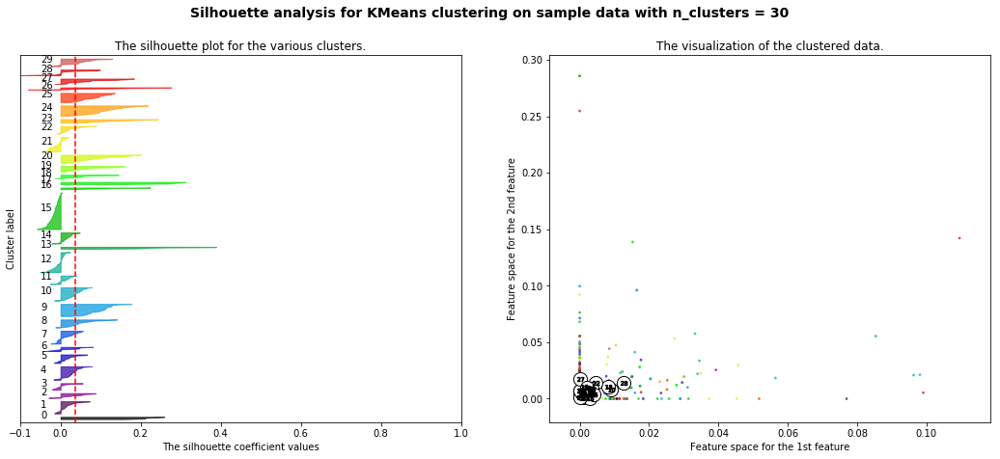

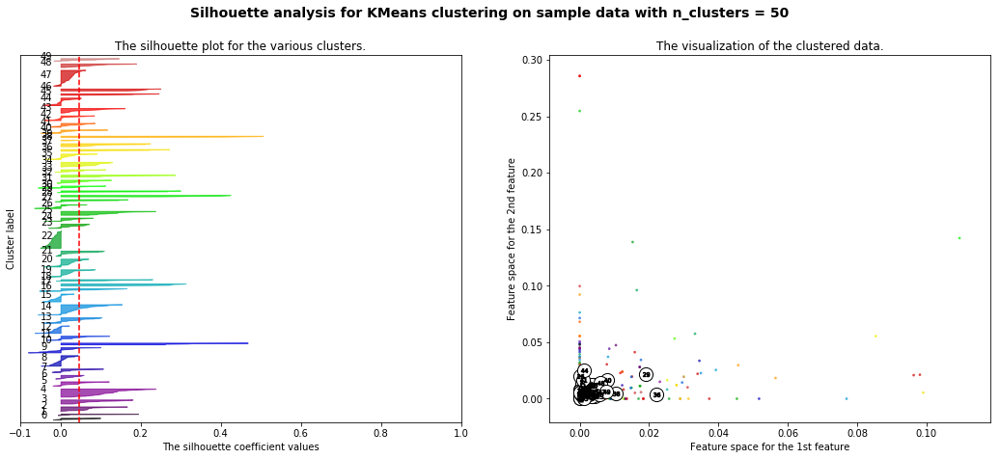

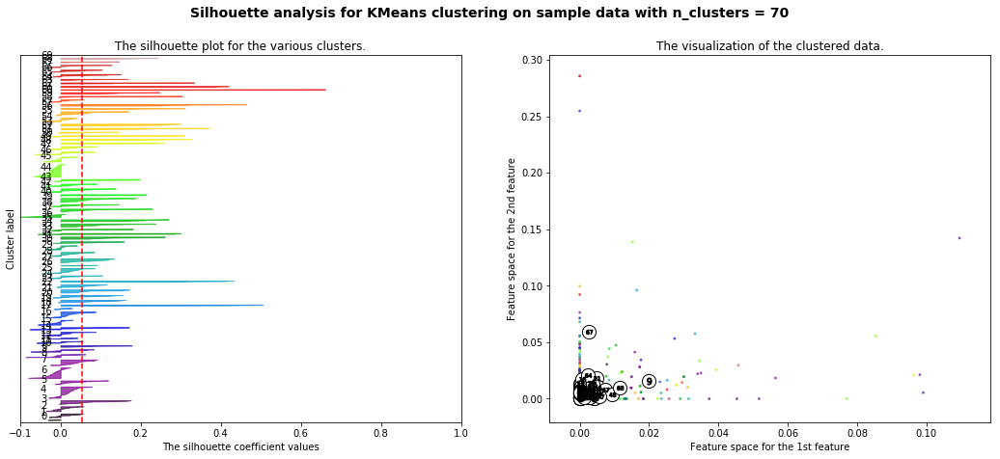

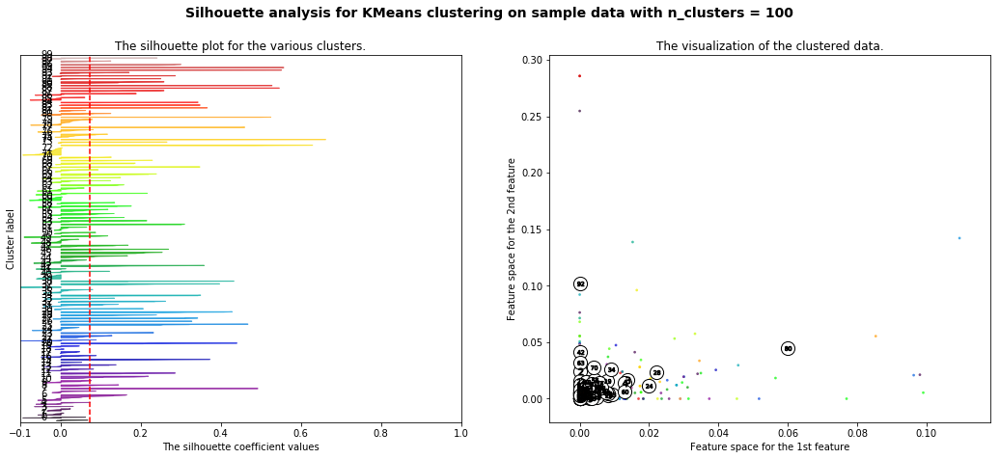

In [101]:
silhouette, range_n_clusters = see_clusters(tfidf_matrix_2.toarray(),clusters,range_n_clusters = [2,5,7,10,20,30,50,70,100])

In [102]:
len(silhouette) == len(range_n_clusters)

True

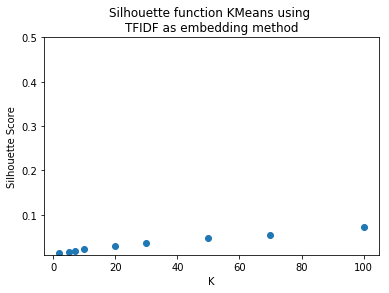

In [103]:
# Plotting the silhouette function to assess the best K to use
plt.scatter(range_n_clusters, silhouette)
plt.ylim(ymin= 0.01 ,ymax = 0.5)
plt.xlabel('K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette function KMeans using \nTFIDF as embedding method')
plt.savefig('sil_km_tfidf')

In [104]:
tfidf_matrix_2.shape

(866, 2500)

### v_measure 

In [105]:
#from sklearn.metrics.cluster import v_measure_score
#v_measure_score(tfidf_matrix_2, cluster_labels)

#### Find distinct keywords in each cluster

In [106]:
words_each_cluster = km.cluster_centers_.argsort()[:, ::-1]

In [107]:
distinct = []
for cluster in words_each_cluster:
    bool_ = False
    tmp = set(cluster[:50])
    not_modified = set(cluster[:50])
    for other in words_each_cluster:
        tmp2 = set(other[:50])
        bool_ = (not_modified != tmp2)
        if bool_:
            tmp = tmp - set(other[:50])
    distinct.append(tmp)

In [108]:
distinct[:1]

[{61,
  374,
  406,
  516,
  620,
  737,
  749,
  940,
  973,
  1070,
  1071,
  1174,
  1354,
  1358,
  1555,
  1596,
  1622,
  1761,
  1762,
  1769,
  2160,
  2451,
  2475,
  2498}]

In [109]:
#feature_names_big[:10]

In [110]:
from __future__ import print_function

order_centroids = km.cluster_centers_.argsort()[:, ::-1] 

print("Top distinct terms per cluster: \n" )    
for i,set_ in enumerate(distinct): #replace 6 with n words per cluster
    print("Cluster %d words:" % i, end='')
    
    for elem in set_:
        print(' %s' % feature_names_big[elem],end = ',')
    print('\n') 
    
    print("Cluster %d titles:" % i, end='\n' )
    for title in df_clusters['titles'][df_clusters['clusters']== i]:
        print(' ** %s,' % title)
        #print()
    print() #add whitespace
    print() #add whitespace
    

Top distinct terms per cluster: 

Cluster 0 words: cultural, opportunities, ways, interest, computing, women, fuse, identities, identity, participation, agency, youth, maker, girls, making, people, program, engineering, programming, projects, disciplinary, environments, stem, communities,

Cluster 0 titles:
 ** Learning Scientific Practices Through Participation as a Volunteer,
 ** Visualizing Complex Classrooms Through Real Time Observations,
 ** “My Favorite Part Is When We Tell the Truth”: Identity and Agency,
 ** Symbiotic Learning Partnerships in Youth Action Sports,
 ** Moving Ahead in the Study of STEM Interests and Interest,
 ** Participatory Design With Students for Technology Integration:,
 ** Forms of Emergent Collaboration in Maker-Based Learning,
 ** Self-Organizing Collaborations as Blueprints for CSCL Design,
 ** Design Considerations for Capturing Computational Thinking,
 ** Learning to Think Computationally: Comparative,
 ** Mobility, Diversity, and Openness: Design Pr

##### Create csv for gephi 

In [111]:
df_authors = pd.DataFrame(data = authors_nodes, columns = ['Label'])

In [112]:
df_authors['Id'] = [i for i in range(len(df_authors))]

In [113]:
df_authors.head()

,Label,Id
0,"Oztok, Murat",0
1,"Gil, Alfredo Jornet",1
2,"Wen, Miaomiao",2
3,"Håklev, Stian",3
4,"Madhok, Jacquie",4


In [114]:
df_edges = pd.DataFrame(data= authors_edges, columns=['Source_name','Target_name'])

In [115]:
dict_ = df_authors.set_index('Id').to_dict(orient= 'dict')
inv_map = {v: k for k, v in dict_['Label'].items()}

In [116]:
df_authors.to_csv('ressources/authors.csv')
df_edges.to_csv('ressources/authors_edges.csv')

In [117]:
df_edges.head()

,Source_name,Target_name
0,"Tabak, Iris","Kirschner, Paul A."
1,"Rosé, Carolyn Penstein","Järvenoja, Hanna"
2,"Shaffer, David Williamson","Ruis, Andrew"
3,"Davis, Katie","Johnson, Raymond"
4,"Järvelä, Sanna","Farnsworth, Jesse"


In [118]:
#df_edges['Source'] = [inv_map[elem] for elem in df_edges['Source']]
#df_edges['Target'] = [inv_map[elem] for elem in df_edges['Target_name']]

In [119]:
#df_edges = df_edges[['Source','Target']]

In [120]:
#df_edges.to_csv('authors_edges.csv')

### Try to analyze the network : 

In [121]:
nx.connected_component_subgraphs(authors_graph)

<generator object connected_component_subgraphs at 0x1a29d7fc50>

In [122]:
gen = nx.connected_component_subgraphs(authors_graph)

In [123]:
page_rank = sorted(nx.pagerank(authors_graph).items(), key=lambda kv: kv[1], reverse= True)

In [124]:
page_rank[:5]

[('Dillenbourg, Pierre', 0.005355613347703817),
 ('Slotta, James D.', 0.0053417754105282165),
 ('Rummel, Nikol', 0.004463762700596426),
 ('Fischer, Frank', 0.0042046626286866475),
 ('Moher, Tom', 0.0034740989990678056)]

In [125]:
def graph_author(author): 
    selected_ = []
    for i,elem in enumerate(df_data['author']):
        #print(elem)
        if author in elem: 
            selected_.append(i)
    df_data.iloc[selected_,:].groupby(['year'])['year'].count().plot(kind='bar')
    plt.title('number of publications per year intervals for ' + author)
    plt.xlabel('years')
    plt.ylabel('publications_count')
    plt.tight_layout()
    return 

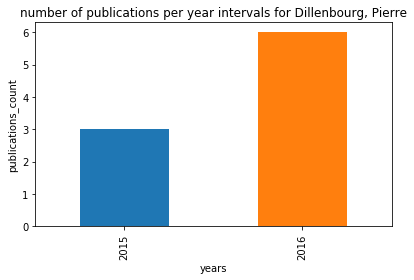

In [126]:
graph_author('Dillenbourg, Pierre')

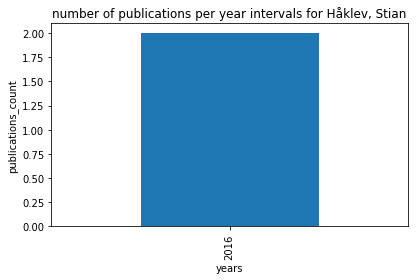

In [127]:
graph_author('Håklev, Stian')

In [128]:
nx.average_degree_connectivity(authors_graph)

{0: 0,
 1: 3.274074074074074,
 2: 3.403669724770642,
 3: 4.642361111111111,
 4: 5.762658227848101,
 5: 9.916666666666666,
 6: 7.716216216216216,
 7: 9.319327731092438,
 8: 8.42732558139535,
 9: 11.917874396135266,
 10: 10.566666666666666,
 11: 10.545454545454545,
 12: 16.431818181818183,
 13: 15.423076923076923,
 14: 14.979591836734693,
 15: 9.266666666666667,
 16: 16.827205882352942,
 17: 11.882352941176471,
 18: 22.061728395061728,
 19: 17.907894736842106,
 20: 15.15,
 21: 19.11904761904762,
 22: 17.84090909090909,
 24: 19.666666666666668,
 25: 18.88,
 26: 9.846153846153847,
 28: 12.142857142857142,
 29: 18.344827586206897,
 31: 10.096774193548388,
 33: 18.151515151515152,
 34: 19.705882352941178,
 51: 16.50980392156863}

In [129]:
#nx.degree(authors_graph)

### Clustering using Glove

In [130]:
#path = '/Users/nourghaliaabassi/Downloads/glove.6B/glove.6B.100d.txt'

In [131]:
# Method for loading a text file in a DataFrame (each row corresponds to a line)
def load_data(path):
    with open(path) as file:
        words_file = pd.DataFrame([line.rstrip() for line in file])
    return words_file

In [132]:
# Method to load glove vectors from glove.6B, which is a file from stanford containing pre-trained glove vectors on
# wikipedia, which is more appropriate in our case than twitter glove vectors even if it contains less than for twitter.
def load_glove(path,n =100,):
    """Loading glove vectors
    n is the dimension of the vectors, can be 50, 100, 200 or 300"""
    glove_vectors_100 = load_data(path)
    glove_vectors_100[0] = glove_vectors_100[0].apply(lambda x : x.split(' ',1))
    words = pd.DataFrame(glove_vectors_100[0].apply(lambda x : x[0]))
    words['Vectors']= glove_vectors_100[0].apply(lambda x : x[1])
    del(glove_vectors_100)
    words.rename(columns={0:'Words'},inplace=True)
    words['Words'] = words.apply(lambda x : [elem.replace('<','').replace('>','') for elem in x ])
    words.set_index('Words',inplace=True)
    return words

In [133]:
#glove_df = load_glove(path)

In [134]:
import zipfile

In [136]:
zf = zipfile.ZipFile('/Users/nourghaliaabassi/Desktop/glove100.csv.zip','r')

In [137]:
csv = zf.extract('glove100.csv')

In [138]:
glove_df = pd.read_csv(csv)

In [139]:
glove_df.head()

,Words,Vectors
0,the,-0.038194 -0.24487 0.72812 -0.39961 0.083172 0...
1,",",-0.10767 0.11053 0.59812 -0.54361 0.67396 0.10...
2,.,-0.33979 0.20941 0.46348 -0.64792 -0.38377 0.0...
3,of,-0.1529 -0.24279 0.89837 0.16996 0.53516 0.487...
4,to,-0.1897 0.050024 0.19084 -0.049184 -0.089737 0...


In [140]:
#glove_df.to_csv('glove100.csv')

In [141]:
glove_df['Vectors'] = glove_df['Vectors'].apply(lambda x : x.split())

dict_of_words_vect = glove_df.set_index('Words').to_dict()['Vectors']

In [143]:
tfidf_matrix_2.toarray()[0]

array([0.        , 0.        , 0.01376927, ..., 0.        , 0.        ,
       0.        ])

In [144]:
feature_index = tfidf_matrix_2[doc,:].nonzero()[1]

In [145]:
max_len = max([len(s) for s in feature_names_big.values()])

In [146]:
def get_all_index_for_documents(tfidf_matrix_2):
    new_matrix = np.chararray(tfidf_matrix_2.shape, itemsize = max_len)
    for doc in range(new_matrix.shape[0]):
        feature_index = tfidf_matrix_2[doc,:].nonzero()[1]
        for index in feature_index:
            new_matrix[doc,index] =  feature_names_big[index]

    return new_matrix

In [147]:
new_matrix = get_all_index_for_documents(tfidf_matrix_2)

In [148]:
new_matrix

chararray([['', '', b'able', ..., '', '', ''],
           ['', '', b'able', ..., '', '', ''],
           ['', b'ability', '', ..., '', '', ''],
           ...,
           ['', '', b'able', ..., '', '', ''],
           ['', b'ability', b'able', ..., '', '', ''],
           ['', '', '', ..., '', '', '']], dtype='|S32')

In [149]:
len(new_matrix[0])

2500

In [150]:
def assign_vectors(matrix, dict_of_words_vect):
    new_matrix = []
    missed = set()
    for elem in matrix:
        representations = []
        for word in elem: 
            sum_ = np.zeros((100,))
            try : 
                if type(word) != type(''):
                    word = word.decode('utf-8')
                representations.append(np.array(list(map(lambda x : float(x),dict_of_words_vect[word]))))
            except KeyError:
                new_sentence = word.split()
                if len(new_sentence) > 1: 
                    for subword in new_sentence: 
                        try : 
                            sum_ += np.array(list(map(lambda x : float(x),dict_of_words_vect[subword])))
                        except KeyError : 
                            missed.add(subword)
                    representations.append(sum_)
                    sum_ = np.zeros((100,))            
        new_matrix.append(representations)
    print(missed)
    return new_matrix

In [151]:
vectors_doc = assign_vectors(new_matrix,dict_of_words_vect)

{'isls', 'bereiter', 'icls', 'posttest', 'scardamalia'}


In [152]:
average_vector = np.array(list(map(lambda x : np.mean(x,axis = 0),vectors_doc)))


In [153]:
average_vector[0]

array([-0.10258878,  0.24245536, -0.03111011,  0.19771645,  0.04033115,
       -0.01598259, -0.02553926,  0.08771445, -0.19985608,  0.07243523,
       -0.01199685, -0.18635559,  0.28854326, -0.0683034 ,  0.05120268,
       -0.08477993,  0.07996555,  0.13504581, -0.29406228,  0.12364448,
       -0.06101818, -0.15444433,  0.08654383, -0.09214757, -0.10934494,
       -0.29808847,  0.03582107, -0.24414524, -0.0993295 ,  0.03573268,
       -0.18250829,  0.28434255, -0.26836544, -0.06877526,  0.09302334,
        0.05254401, -0.06829198,  0.11907346, -0.20855503, -0.05308663,
       -0.408436  , -0.17739287, -0.00990471, -0.0778709 , -0.16045181,
       -0.11784207,  0.14556804, -0.15896916, -0.16304006, -0.51215902,
        0.25679374, -0.08236408,  0.0252751 ,  0.76854606,  0.04579556,
       -1.68339154,  0.08768332, -0.35326908,  1.35833354,  0.33410142,
       -0.21304782,  0.56136194, -0.03184713, -0.05536602,  0.68477501,
       -0.02613915,  0.09455074,  0.07777877,  0.32408218, -0.03

### Clustering 

In [154]:
num_clusters = 2
km_glove = KMeans(n_clusters=num_clusters)
%time km_glove.fit(average_vector)
clusters_glove = km_glove.labels_.tolist()

CPU times: user 308 ms, sys: 7.17 ms, total: 315 ms
Wall time: 82.9 ms


For n_clusters = 2 The average silhouette_score is : 0.1257533837110148
For n_clusters = 3 The average silhouette_score is : 0.10306348647712084
For n_clusters = 5 The average silhouette_score is : 0.08863216213732113
For n_clusters = 7 The average silhouette_score is : 0.07171527543676046
For n_clusters = 10 The average silhouette_score is : 0.05943522880675653
For n_clusters = 20 The average silhouette_score is : 0.04833985266937922


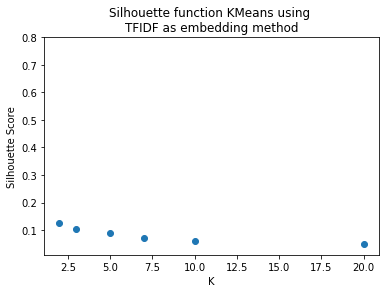

In [155]:
from __future__ import print_function
from sklearn.metrics import silhouette_samples, silhouette_score
range_n_clusters = [2,3,5,7,10,20]
silhouette = []
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(average_vector)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(average_vector, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    silhouette.append(silhouette_avg)
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(tfidf_matrix_2, cluster_labels)

plt.scatter([2,3,5,7,10,20], silhouette)
plt.ylim(ymin= 0.01 ,ymax = 0.8)
plt.xlabel('K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette function KMeans using \nTFIDF as embedding method')
plt.savefig('sil_km_tfidf')

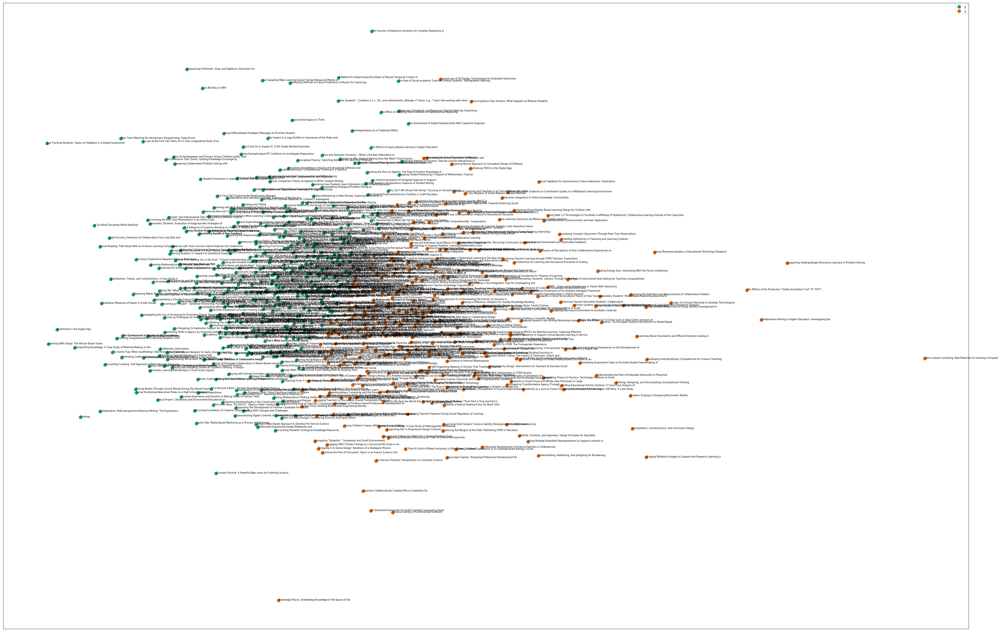

In [156]:
plot_cos_dist_clust(average_vector,clusters_glove)

For n_clusters = 2 The average silhouette_score is : 0.1257533837110148
For n_clusters = 3 The average silhouette_score is : 0.10306348647712084
For n_clusters = 5 The average silhouette_score is : 0.08863216213732113
For n_clusters = 7 The average silhouette_score is : 0.07171527543676046
For n_clusters = 10 The average silhouette_score is : 0.05943522880675653
For n_clusters = 20 The average silhouette_score is : 0.04833985266937922


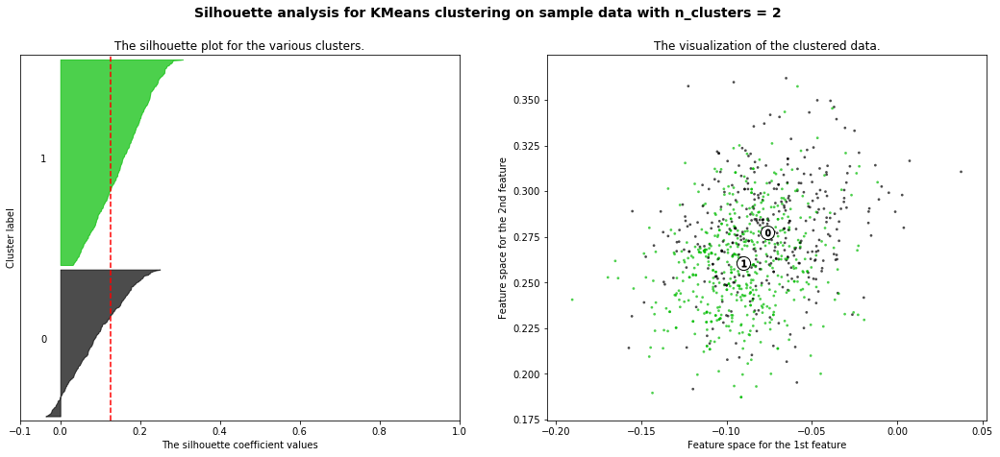

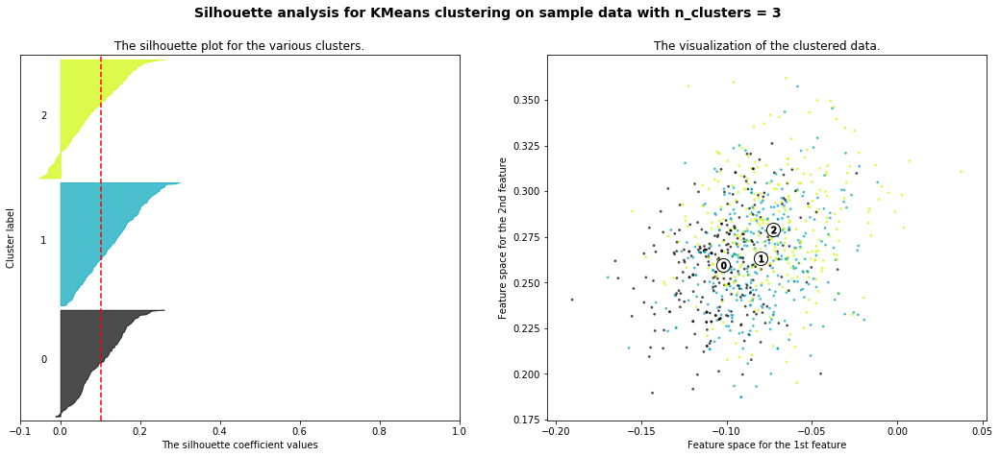

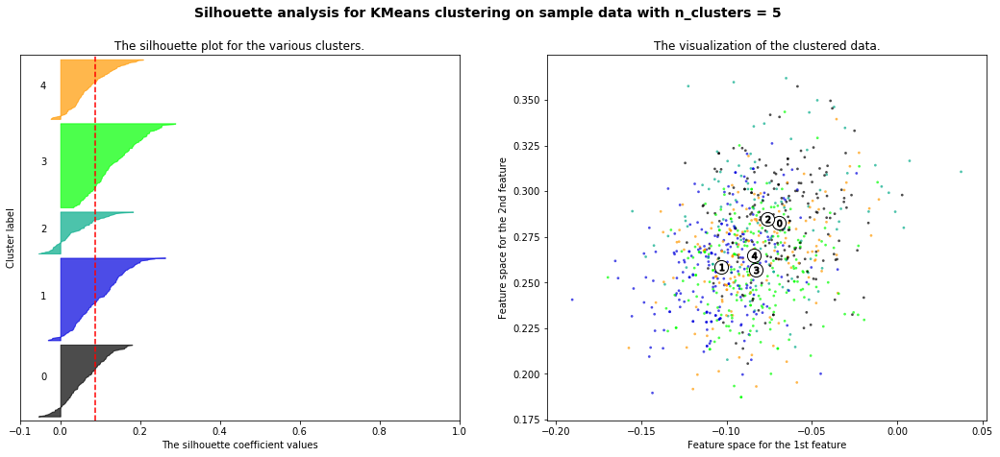

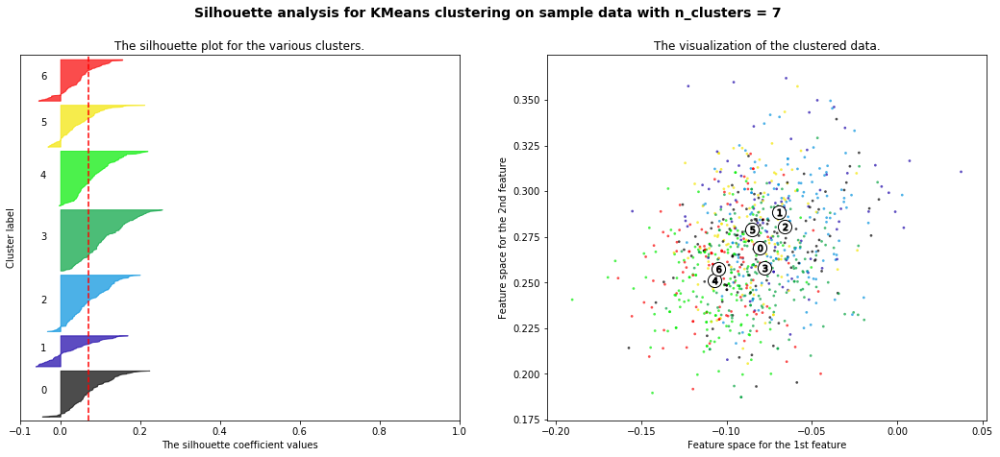

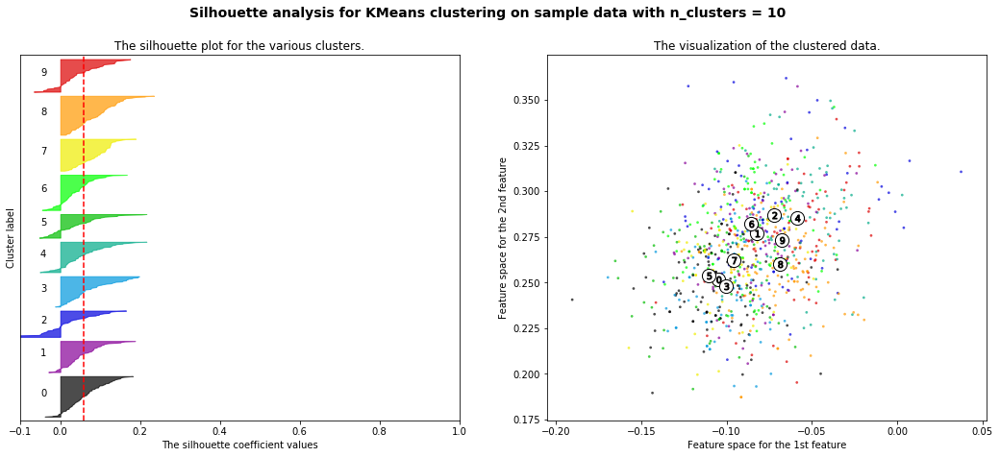

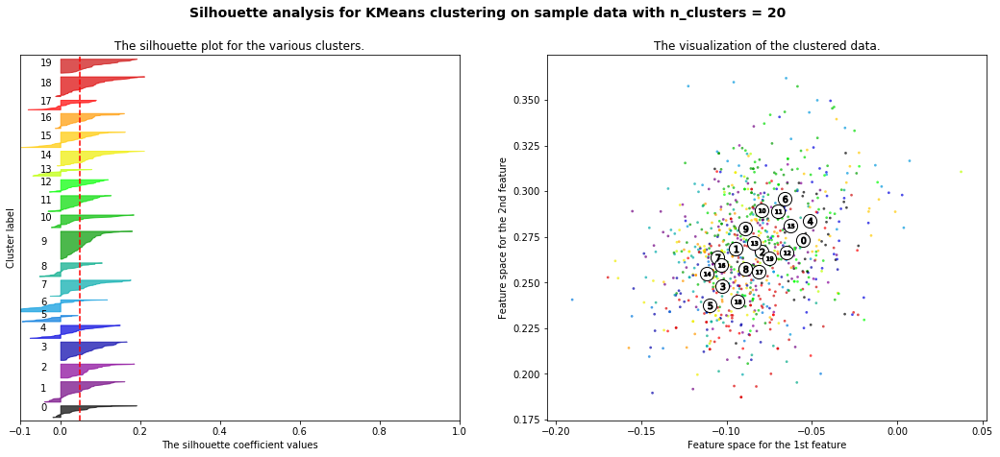

([0.1257533837110148,
  0.10306348647712084,
  0.08863216213732113,
  0.07171527543676046,
  0.05943522880675653,
  0.04833985266937922],
 [2, 3, 5, 7, 10, 20])

In [157]:
see_clusters(average_vector,clusters_glove,range_n_clusters)

### PCA to try to see the clustering on the two most important axis

In [159]:
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA

In [160]:
sc = StandardScaler().fit(average_vector)
average_vector_standerdised = sc.transform(average_vector)


pca = PCA(.95)
pca.fit((average_vector_standerdised))
components = pca.transform((average_vector))
approximation = pca.inverse_transform(components)
print('PCA used %s components' %pca.n_components_)

PCA used 52 components


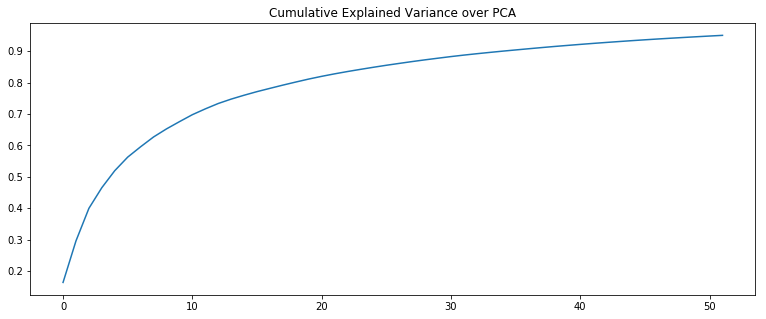

In [161]:
plt.figure(figsize=(13, 5));
plt.title('Cumulative Explained Variance over PCA');
plt.plot(pca.explained_variance_ratio_.cumsum());


In [162]:
pca = PCA(n_components=38)
pca.fit(average_vector)

PCA(copy=True, iterated_power='auto', n_components=38, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [163]:
components = pca.transform((average_vector))

In [164]:
num_clusters = 2
km_glove = KMeans(n_clusters=num_clusters)
%time km_glove.fit(components)
clusters_glove_pca = km_glove.labels_.tolist()

CPU times: user 284 ms, sys: 5.98 ms, total: 290 ms
Wall time: 74.8 ms


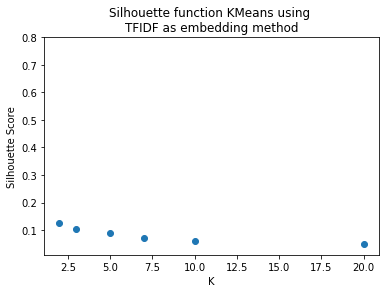

In [165]:

plt.scatter([2,3,5,7,10,20], silhouette)
plt.ylim(ymin= 0.01 ,ymax = 0.8)
plt.xlabel('K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette function KMeans using \nTFIDF as embedding method')
plt.savefig('sil_km_tfidf')

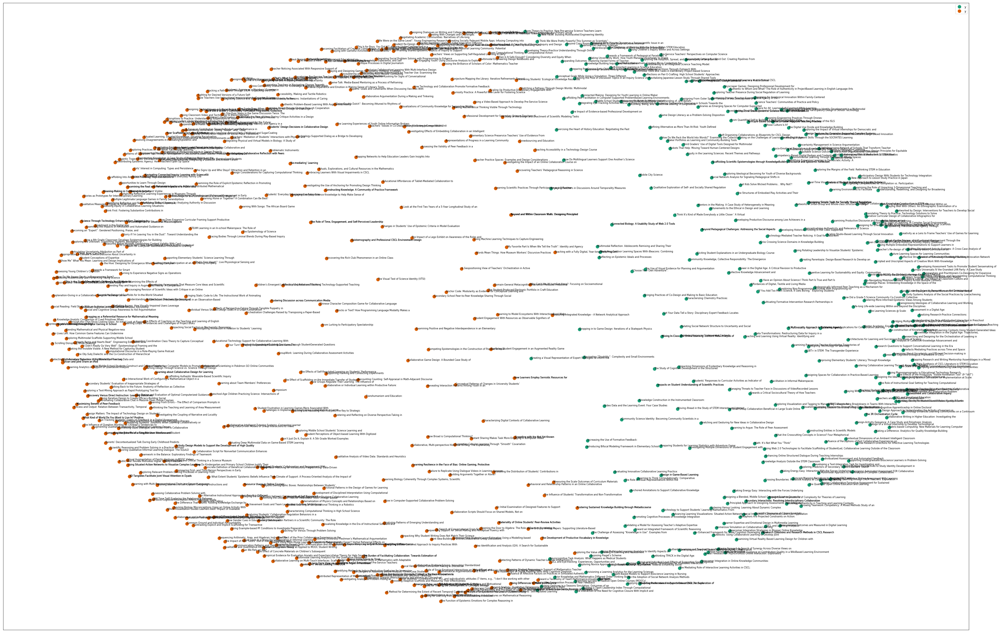

In [166]:
plot_cos_dist_clust(components,clusters_glove_pca)

For n_clusters = 2 The average silhouette_score is : 0.13555525036693622
For n_clusters = 3 The average silhouette_score is : 0.1131844988136037
For n_clusters = 5 The average silhouette_score is : 0.09754419150556347
For n_clusters = 7 The average silhouette_score is : 0.08217176407514785
For n_clusters = 10 The average silhouette_score is : 0.06197894503008828
For n_clusters = 20 The average silhouette_score is : 0.04771620472331094


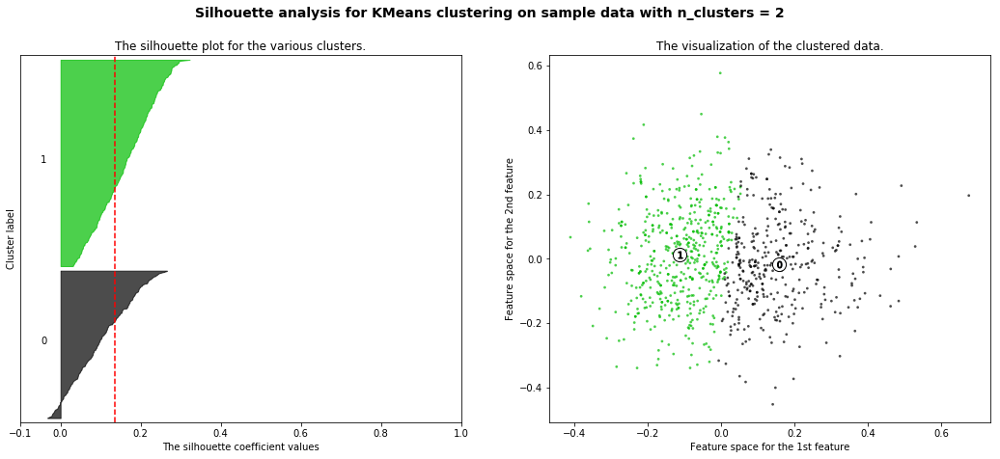

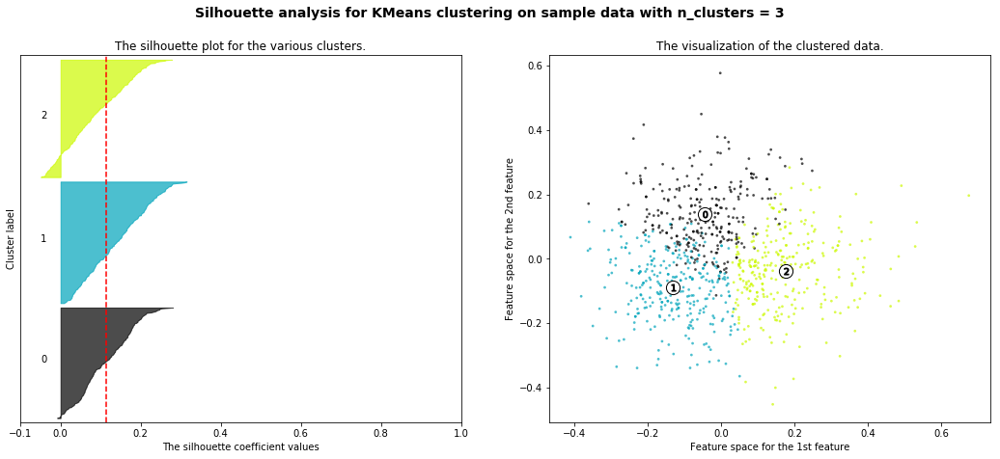

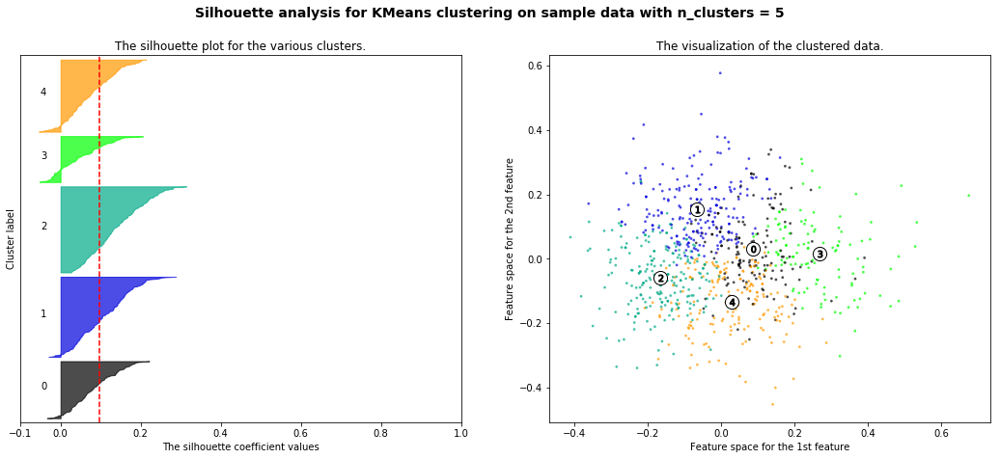

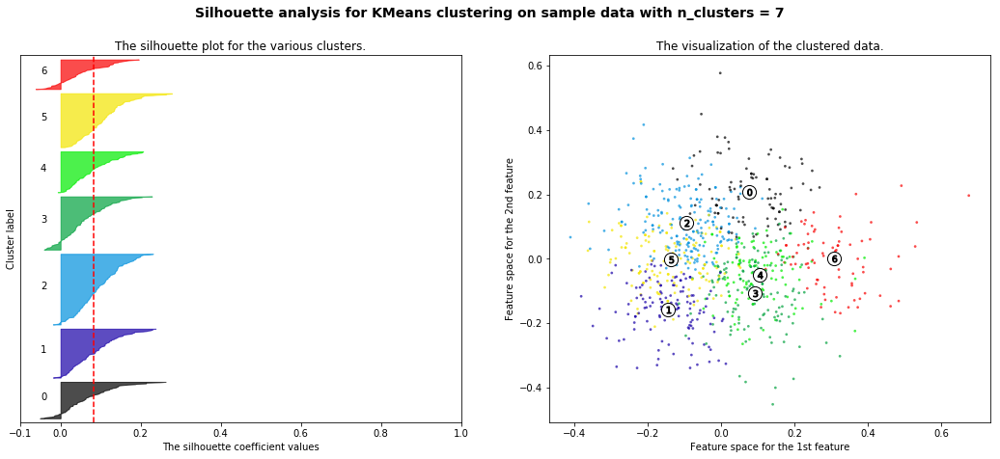

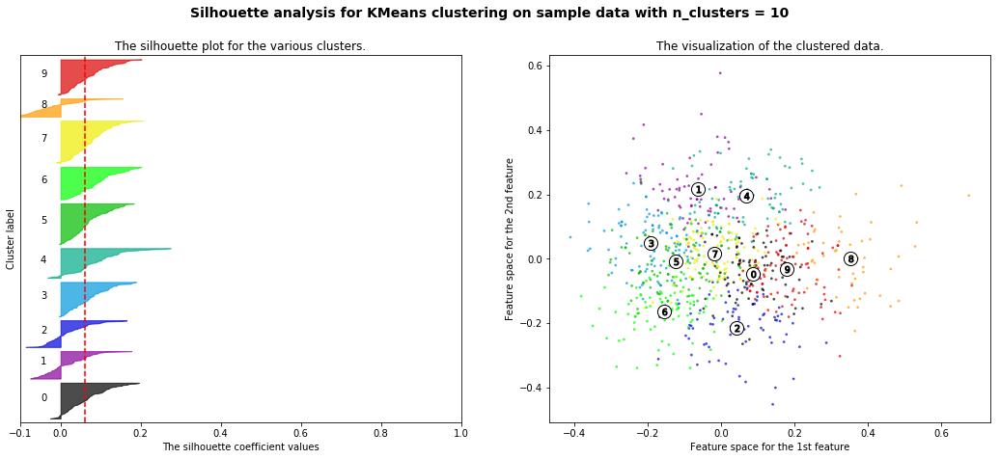

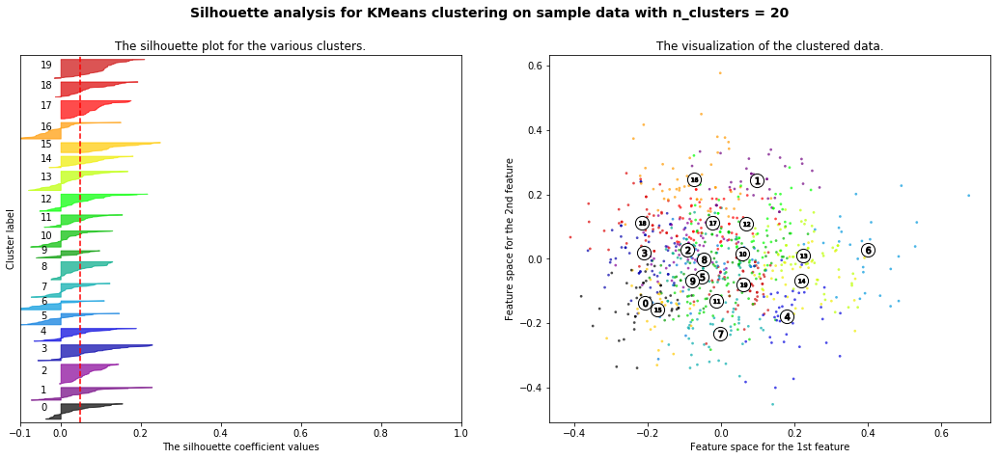

In [167]:
silhouette, range_n_clusters = see_clusters(components,clusters_glove_pca,range_n_clusters) 

In [172]:
df_data.to_csv('data_key_words.csv')

In [173]:
df_data.head()

,accessioned,iso,None,uri,author,available,none,issued,abstract,citation,year,key_words_rake
307,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.307,"{Hmelo-Silver, Cindy E.}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,While research questions play a critical role ...,"Jeong, H. & Hmelo-Silver, C. E. (2015). Resear...",2015,"[(data included detailed observation notes, 20..."
309,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.309,"{Wasson, Barbara, Guribye, Frode}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,This paper describes a study of students desig...,"Wake, J. D., Guribye, F., & Wasson, B. (2015)....",2015,"[(designing robot bodies class session, 23.2),..."
391,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.391,"{Rosé, Carolyn Penstein, Ong, Yann Shiou}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,In this paper we assess the utility of an acti...,"Borge, M., Ong, Y. S., & Rosé, C. P. (2015). ...",2015,[]
150,2017-06-19 14:15:51+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.150,"{Ryberg, Thomas}",2017-06-19 14:15:51+00:00,Book chapter,2015-07,"In CSCL studies, language is often foregrounde...","Davidsen, J. & Ryberg, T. (2015). “This Is the...",2015,[(methodologically rigorous psychometric scale...
396,2017-06-19 14:51:54+00:00,en,\n,https://doi.dx.org/10.22318/cscl2015.396,"{Lee, Christine, Enyedy, Noel, Danish, Joshua A.}",2017-06-19 14:51:54+00:00,Book chapter,2015-07,Designs that leverage embodiment argue that em...,"Saleh, A., Danish, J. A., Enyedy, N., & Lee, C...",2015,"[(final high school qualification grade, 16.47..."
